# Part 1b - Finfing pupil - morphological operations

## Setup

In [1]:
import os
import random
import re

import math
import numpy as np
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.patches as patches

import cv2
from PIL import Image

## Loading images and preprocessing

In [2]:
def load_images_ending_with_pattern(folder_path, regex):
    images = []
    pattern = re.compile(regex)

    for root, _, files in os.walk(folder_path):
        for file in files:
            if not pattern.match(file):
                continue
            file_path = os.path.join(root, file)
            try:
                with Image.open(file_path) as img:
                    img.verify()
                image = cv2.imread(file_path, cv2.IMREAD_COLOR)
                if image is not None:
                    images.append(image)
            except Exception:
                print(f"Skipping non-image file: {file_path}")
    return images

def preview_images(images, num_previews=5):
    if not images:
        print("No images to display.")
        return

    num_previews = min(num_previews, len(images))
    selected_images = images[:num_previews]
    
    cols = min(15, num_previews)
    rows = math.ceil(num_previews / 15)
    
    plt.figure(figsize=(cols * 3, rows * 3))
    for i, img in enumerate(selected_images):
        img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        plt.subplot(rows, cols, i + 1)
        plt.imshow(img_rgb)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

def resize_images(images, max_size=256):
    resized = []
    for img in images:
        h, w = img.shape[:2]
        scale = max_size / max(h, w)
        new_size = (int(w * scale), int(h * scale))  # (width, height)
        resized_img = cv2.resize(img, new_size, interpolation=cv2.INTER_AREA)
        resized.append(resized_img)
    return resized

def convert_images_to_greyscale(images):
    grey_images = []
    for img in images:
        if len(img.shape) == 3:
            grey_img = np.mean(img, axis=2).astype(img.dtype)
        else:
            grey_img = img.copy()
        grey_images.append(grey_img)
    return grey_images

def adaptive_binarize_pupil(
    grey_images,
    initial_factor,
    white_ratio_thresh=0.9,
    min_factor=1.0,
    factor_step=0.5,
    verbose=False
):
    pupil_binaries = []

    for idx, grey in enumerate(grey_images):
        X = initial_factor
        while True:

            #------------------------------------------
            # Image sizes
            h, w = grey.shape
            # Treshold based on mean
            P = np.sum(grey) / (h * w)
            # Modified treshold
            P = P / X
            # Binarization
            bin_image = np.zeros_like(grey, dtype=np.uint8)
            bin_image[grey >= P] = 255
            #------------------------------------------

            white_ratio = np.mean(bin_image == 255)
            if white_ratio > white_ratio_thresh and (X - factor_step) >= min_factor:
                new_X = round(X - factor_step, 2)
                if verbose:
                    print(
                        f"Image {idx}: white ratio {white_ratio:.3f} > {white_ratio_thresh}, "
                        f"lowering factor {X:.2f} → {new_X:.2f} and retrying"
                    )
                X = new_X
                continue
            break

        # Print final threshold if not verbose
        if not verbose:
            print(
                f"Image {idx}: final threshold P/X = {P/X:.2f} (factor X = {X:.2f}), "
                f"white ratio = {white_ratio:.3f}"
            )

        pupil_binaries.append(bin_image)

    return pupil_binaries

Image 0: final threshold P/X = 5.66 (factor X = 5.70), white ratio = 0.975
Image 1: final threshold P/X = 6.27 (factor X = 5.30), white ratio = 0.974
Image 2: final threshold P/X = 3.79 (factor X = 6.35), white ratio = 0.974
Image 3: final threshold P/X = 3.80 (factor X = 6.60), white ratio = 0.969
Image 4: final threshold P/X = 7.93 (factor X = 4.55), white ratio = 0.975
Image 5: final threshold P/X = 6.20 (factor X = 5.20), white ratio = 0.975
Image 6: final threshold P/X = 3.59 (factor X = 7.00), white ratio = 0.975
Image 7: final threshold P/X = 3.09 (factor X = 7.15), white ratio = 0.975
Image 8: final threshold P/X = 7.74 (factor X = 4.40), white ratio = 0.975
Image 9: final threshold P/X = 6.92 (factor X = 4.65), white ratio = 0.974
Image 10: final threshold P/X = 4.96 (factor X = 6.05), white ratio = 0.975
Image 11: final threshold P/X = 7.44 (factor X = 5.00), white ratio = 0.975
Image 12: final threshold P/X = 15.77 (factor X = 3.15), white ratio = 0.973
Image 13: final thres

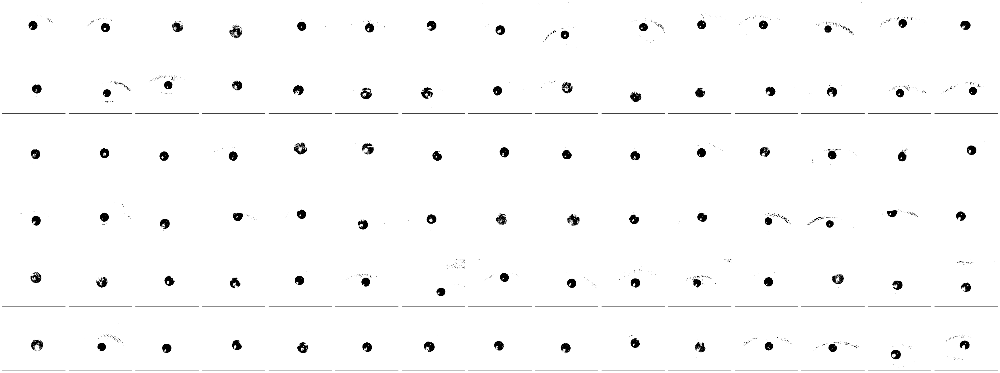

In [15]:
images = load_images_ending_with_pattern('MMU-Iris-Database', r'.*[^0-9]?1\.[a-zA-Z]+$')

grey_images = convert_images_to_greyscale(images)
binarized_pupil_images = adaptive_binarize_pupil(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=0.975,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

preview_images(binarized_pupil_images, num_previews=len(binarized_pupil_images))

## Morphological operations

After first tests I decided to use ellipcital (circular) kernel shape with the anchor in the middle. This seems to be the most natural choice as we are working with round pupils. For the most part the results when using eircular and rectangular kernels were similar. The biggest difference was how the pupil was connected with iris during closing: the rectangle caused the connection to be more pronounced and uniform in width. Meanwhile circular doesn't have this problem.

In theory circural structuring element treats every direction the same (we want this) and rectangular kernel has more weights on diagonal and antidiagonal. I choosed to continue with the circular kernel as I want to disturb the round pupil as least as possible.

In [4]:
def get_structuring_element(shape, ksize, anchor=None):
    rows, cols = ksize
    if anchor is None:
        anchor = (rows // 2, cols // 2)
    if shape.lower() == "rect":
        kernel = np.ones((rows, cols), dtype=np.uint8)
    elif shape.lower() == "ellipse":
        kernel = np.zeros((rows, cols), dtype=np.uint8)
        # Use the center of the kernel for ellipse definition.
        cy, cx = rows // 2, cols // 2  
        a = rows / 2.0
        b = cols / 2.0
        for i in range(rows):
            for j in range(cols):
                # Equation of ellipse centered at (cy, cx)
                if ((i - cy) / a)**2 + ((j - cx) / b)**2 <= 1:
                    kernel[i, j] = 1
    elif shape.lower() == "cross":
        kernel = np.zeros((rows, cols), dtype=np.uint8)
        # Place ones in the row and column corresponding to anchor
        ay, ax = anchor
        if 0 <= ay < rows:
            kernel[ay, :] = 1
        if 0 <= ax < cols:
            kernel[:, ax] = 1
    else:
        raise ValueError("Unsupported kernel shape. Choose 'rect', 'ellipse', or 'cross'.")
    return kernel, anchor

def erosion(image, kernel, anchor):
    krows, kcols = kernel.shape
    ay, ax = anchor
    pad_top = ay
    pad_bottom = krows - ay - 1
    pad_left = ax
    pad_right = kcols - ax - 1
    padded = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=image.min())
    out = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(rows):
        for j in range(cols):
            region = padded[i:i+krows, j:j+kcols]
            out[i, j] = np.max(region[kernel==1])
    return out

def dilation(image, kernel, anchor):
    krows, kcols = kernel.shape
    ay, ax = anchor
    pad_top = ay
    pad_bottom = krows - ay - 1
    pad_left = ax
    pad_right = kcols - ax - 1
    padded = np.pad(image, ((pad_top, pad_bottom), (pad_left, pad_right)), mode='constant', constant_values=image.max())
    out = np.zeros_like(image)
    rows, cols = image.shape
    for i in range(rows):
        for j in range(cols):
            region = padded[i:i+krows, j:j+kcols]
            out[i, j] = np.min(region[kernel==1])
    return out

def opening(image, kernel, anchor):
    eroded = erosion(image, kernel, anchor)
    opened = dilation(eroded, kernel, anchor)
    return opened

def closing(image, kernel, anchor):
    dilated = dilation(image, kernel, anchor)
    closed = erosion(dilated, kernel, anchor)
    return closed

### Closing operation

First, I will use closing operation to patch the holes in the pupil. I want to choose as small kernel size as possible not to enchance the artifacts in the process.

Kernel size: 84 ( 30 percent of width ) ------------------------------------------------------


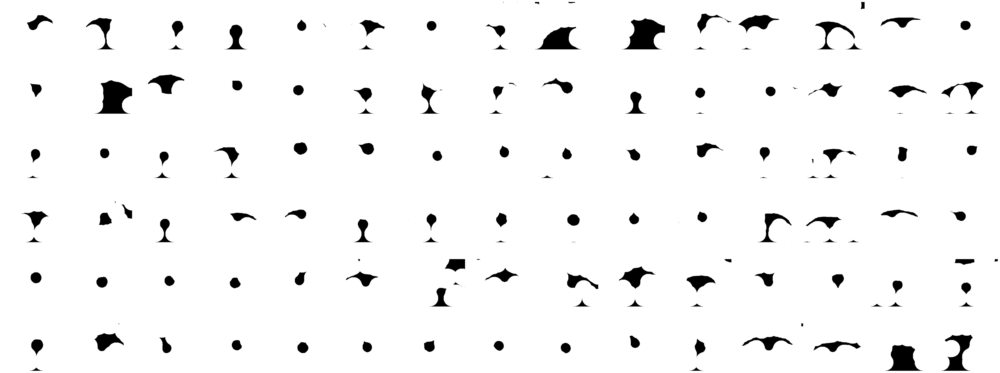


Kernel size: 70 ( 25 percent of width ) ------------------------------------------------------


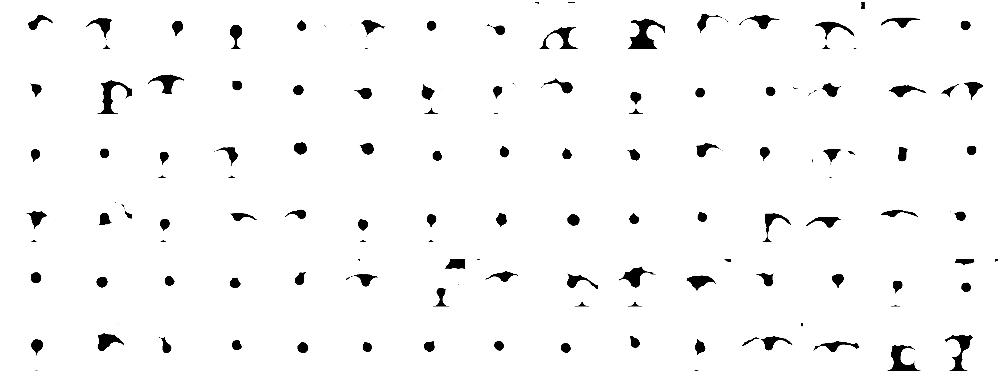


Kernel size: 56 ( 20 percent of width ) ------------------------------------------------------


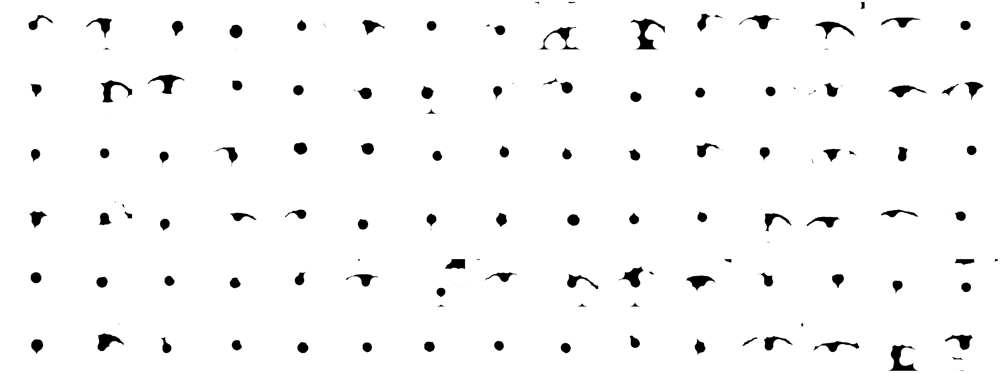


Kernel size: 42 ( 15 percent of width ) ------------------------------------------------------


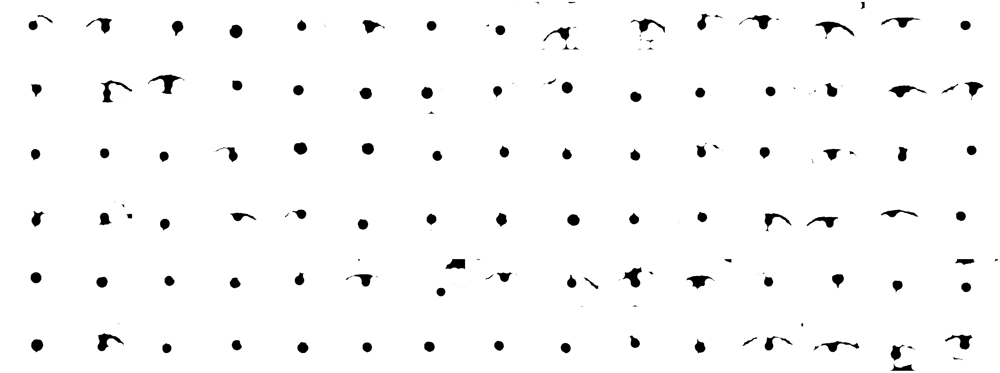

In [16]:
step = 5
min_percent_of_width = 15
max_percent_of_width = 30

for percent_of_width in [round(max_percent_of_width - i*step, 3) for i in range(int((max_percent_of_width-min_percent_of_width)/step) + 1)]:
    
    kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
    print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')
    
    structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
    closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]
    preview_images(closed_images, num_previews=len(closed_images))
    
    print()

Kernel size: 28 ( 10.0 percent of width ) ------------------------------------------------------


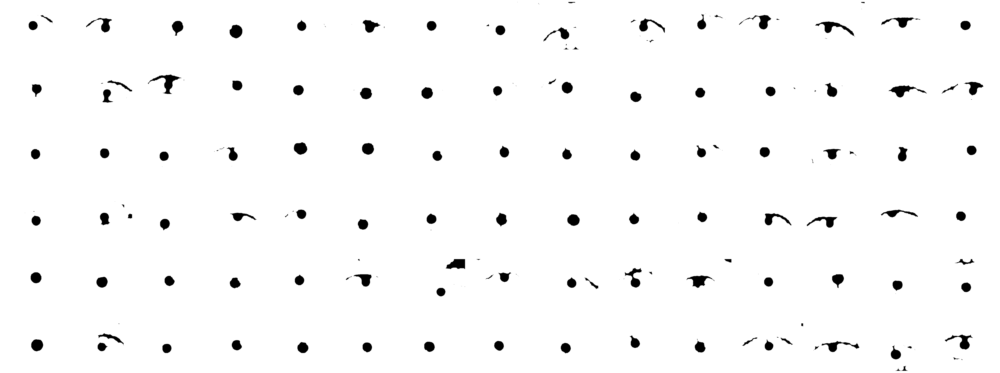


Kernel size: 26 ( 9.5 percent of width ) ------------------------------------------------------


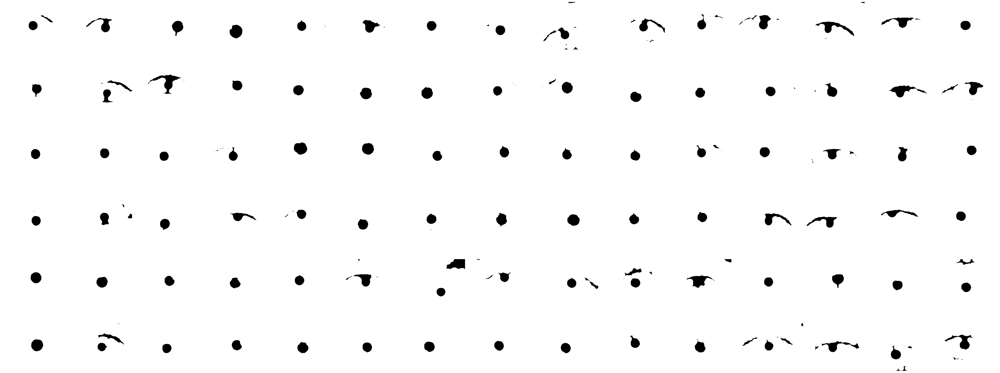


Kernel size: 25 ( 9.0 percent of width ) ------------------------------------------------------


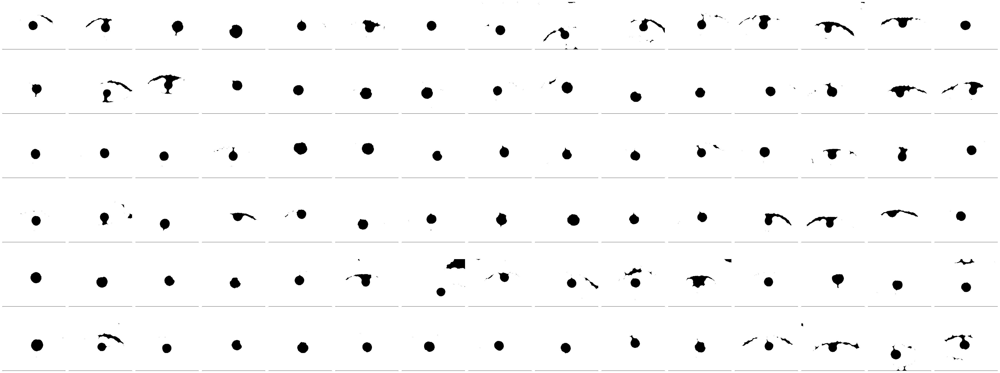


Kernel size: 23 ( 8.5 percent of width ) ------------------------------------------------------


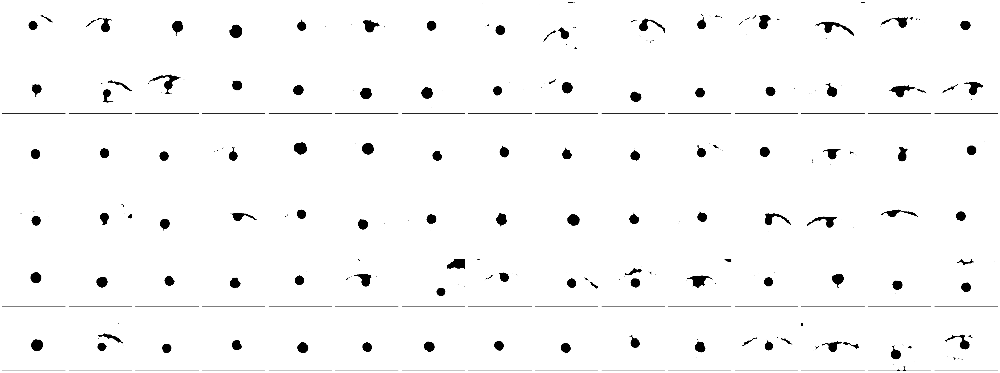


Kernel size: 22 ( 8.0 percent of width ) ------------------------------------------------------


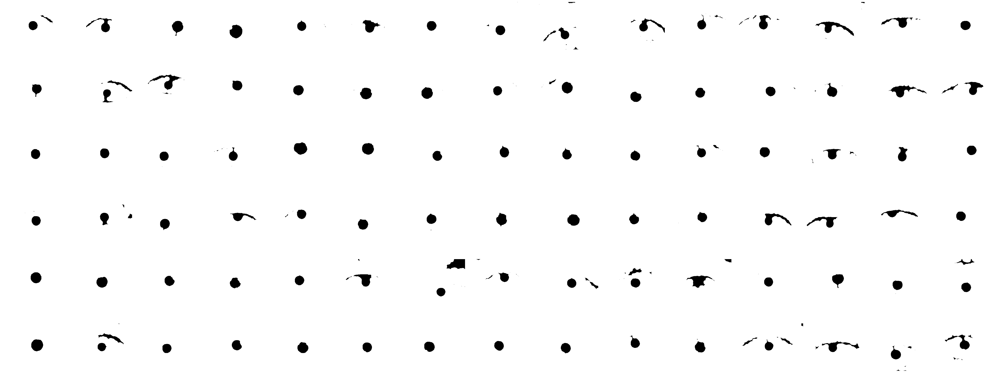


Kernel size: 21 ( 7.5 percent of width ) ------------------------------------------------------


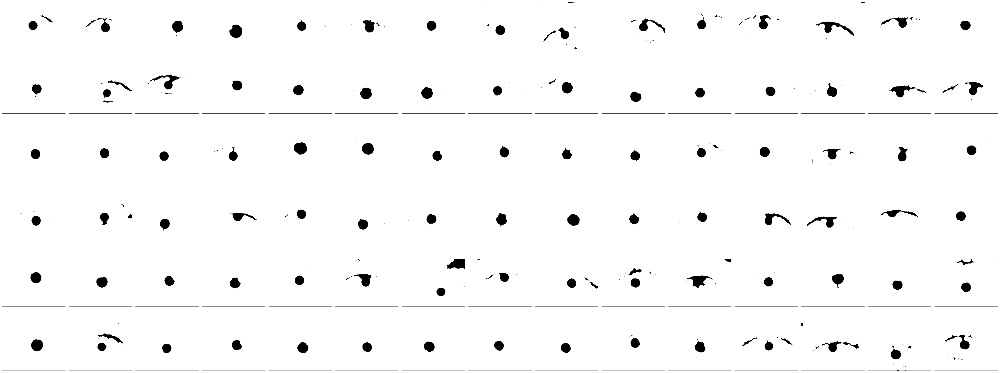


Kernel size: 19 ( 7.0 percent of width ) ------------------------------------------------------


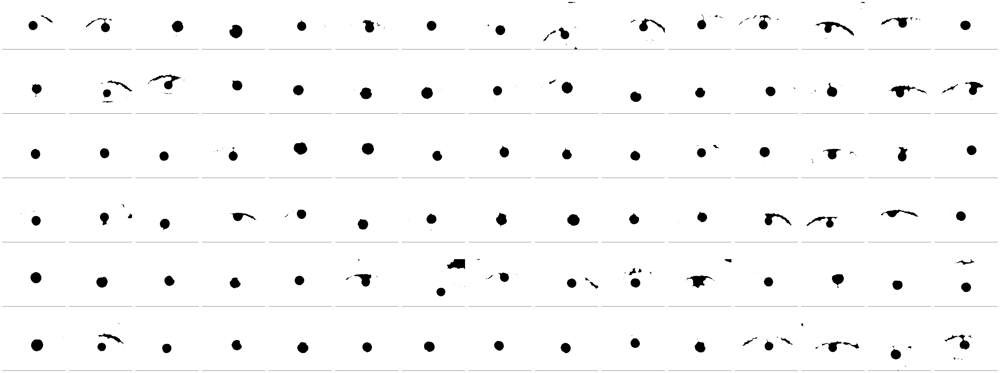


Kernel size: 18 ( 6.5 percent of width ) ------------------------------------------------------


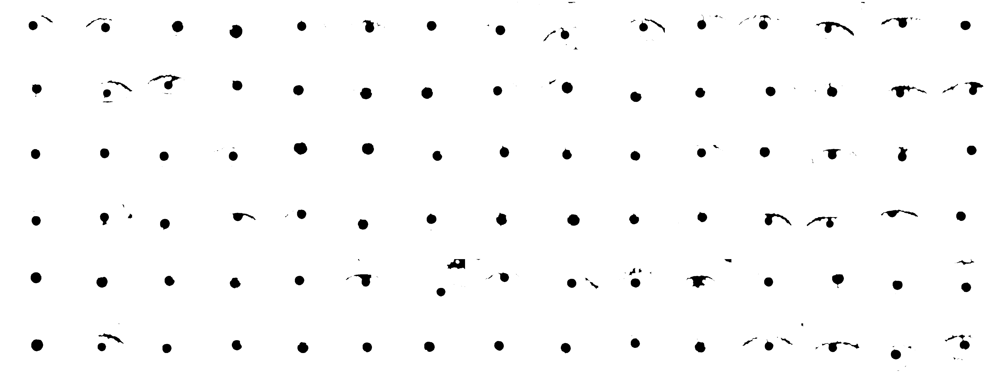


Kernel size: 16 ( 6.0 percent of width ) ------------------------------------------------------


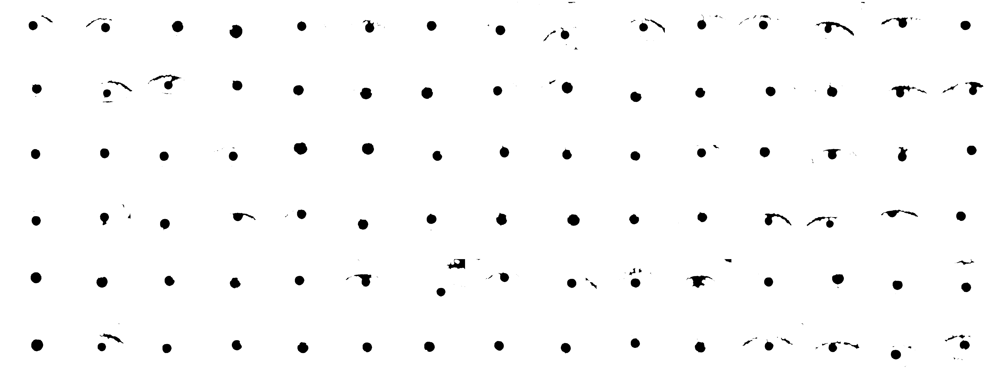


Kernel size: 15 ( 5.5 percent of width ) ------------------------------------------------------


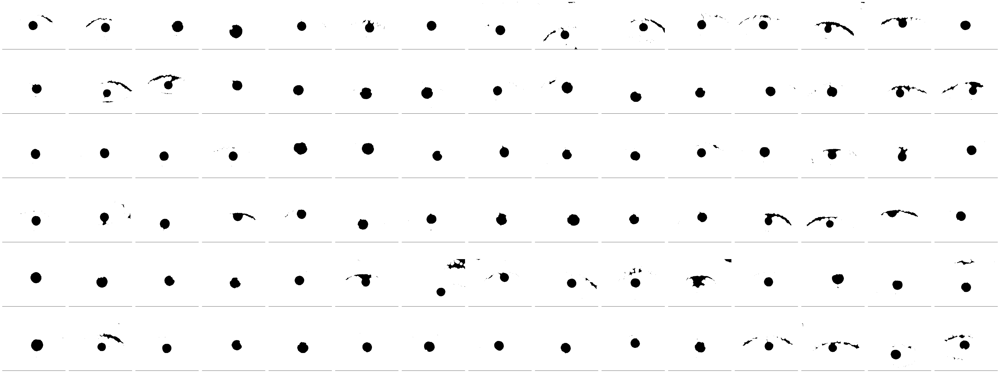


Kernel size: 14 ( 5.0 percent of width ) ------------------------------------------------------


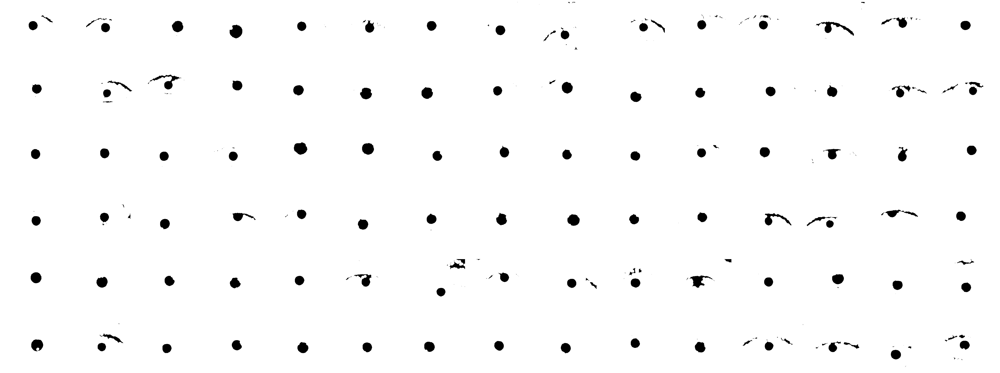


Kernel size: 12 ( 4.5 percent of width ) ------------------------------------------------------


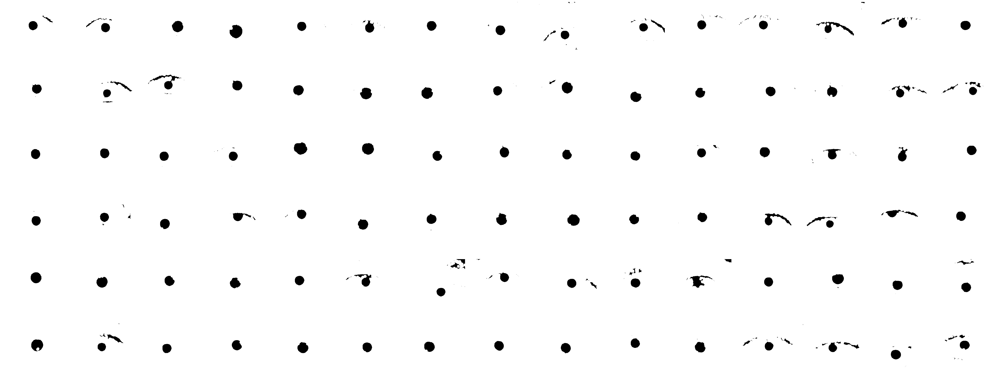


Kernel size: 11 ( 4.0 percent of width ) ------------------------------------------------------


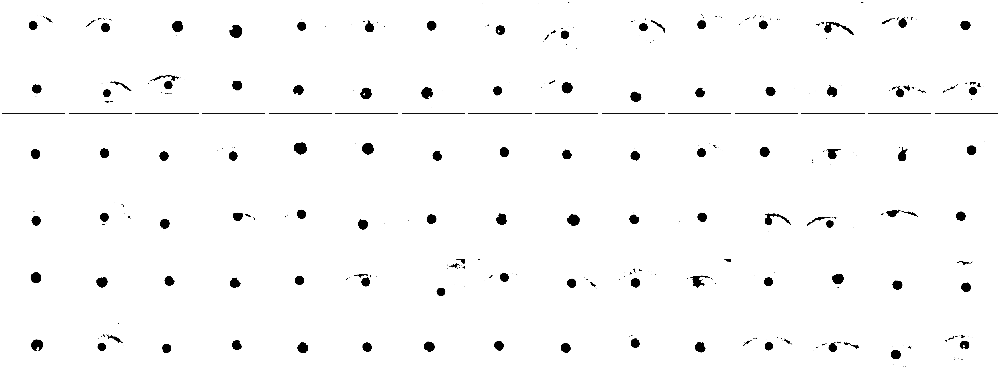


Kernel size: 9 ( 3.5 percent of width ) ------------------------------------------------------


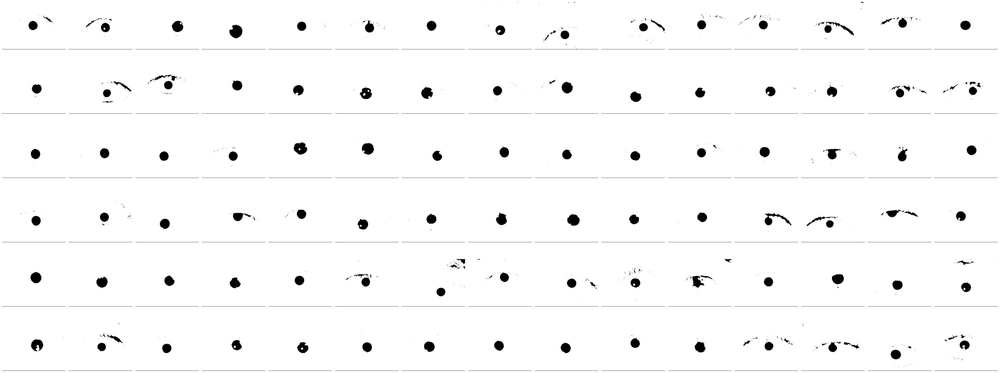


Kernel size: 8 ( 3.0 percent of width ) ------------------------------------------------------


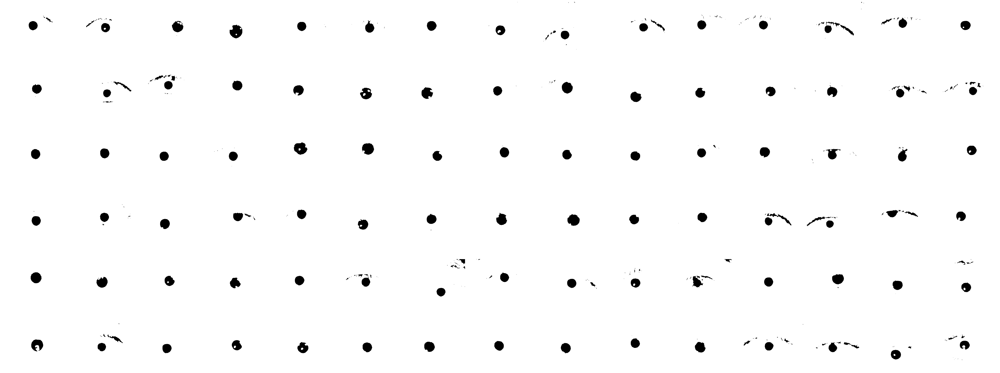


Kernel size: 7 ( 2.5 percent of width ) ------------------------------------------------------


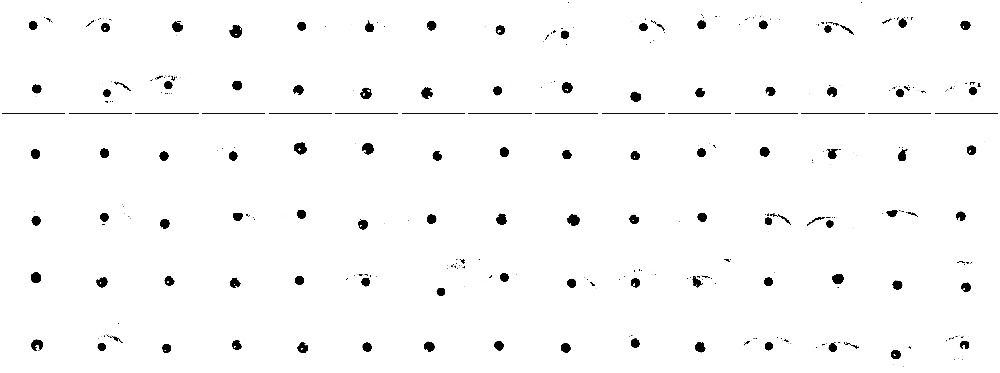


Kernel size: 5 ( 2.0 percent of width ) ------------------------------------------------------


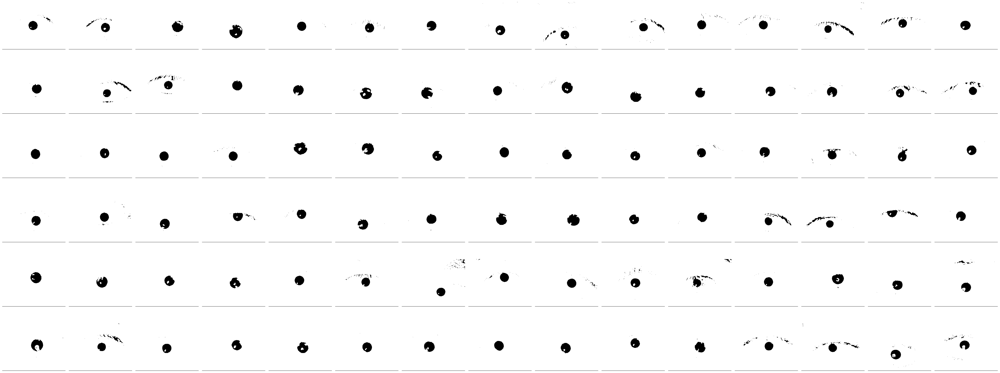


Kernel size: 4 ( 1.5 percent of width ) ------------------------------------------------------


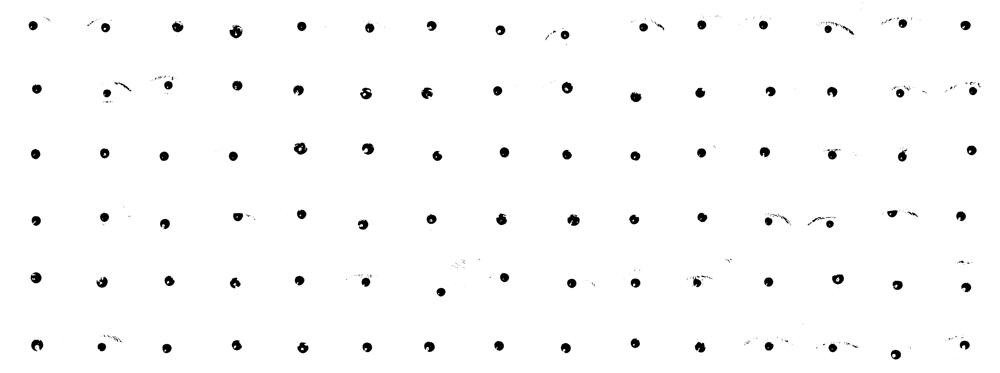


Kernel size: 2 ( 1.0 percent of width ) ------------------------------------------------------


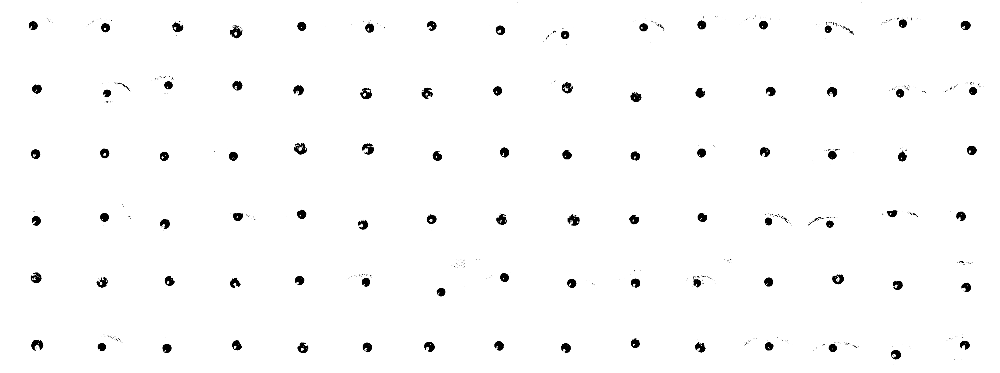


Kernel size: 1 ( 0.5 percent of width ) ------------------------------------------------------


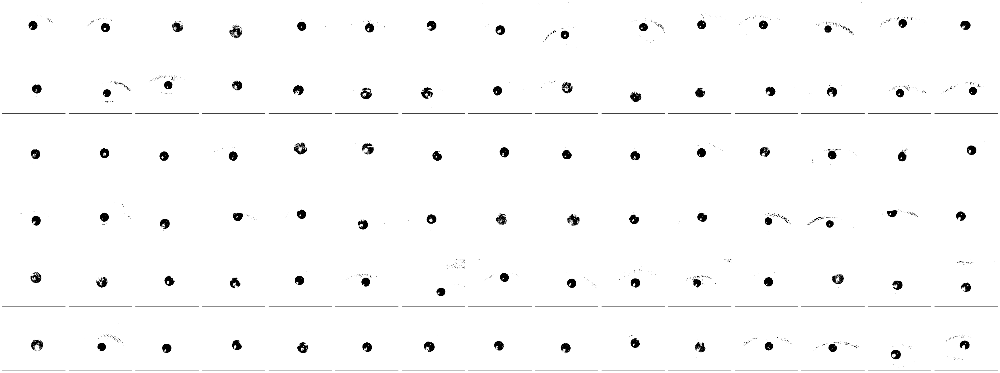

In [5]:
step = 0.5
min_percent_of_width = 0.5
max_percent_of_width = 10

for percent_of_width in [round(max_percent_of_width - i*step, 3) for i in range(int((max_percent_of_width-min_percent_of_width)/step) + 1)]:
    
    kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
    print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')
    
    structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
    closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]
    preview_images(closed_images, num_previews=len(closed_images))
    
    print()

### Choosing the best closing kernel size

relative to the image width.

Kernel size: 15 ( 5.5 percent of width ) ------------------------------------------------------


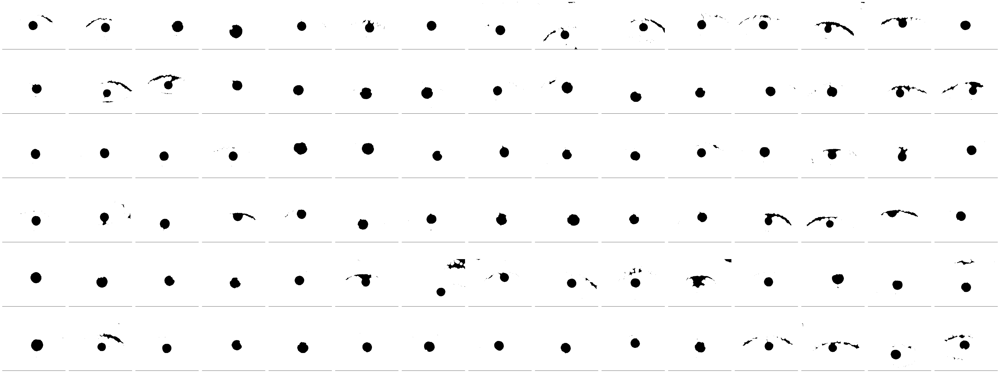

In [6]:
percent_of_width = 5.5

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')

structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]

preview_images(closed_images, num_previews=len(closed_images))

### Opening operation after closing

After the closing operation I want to use opening to remove the artifacts. Here I want to choose large enough kernel size in order to remove the artifacts, but too large and I might erase the pupil.

Kernel size: 56 ( 20 percent of width ) ------------------------------------------------------


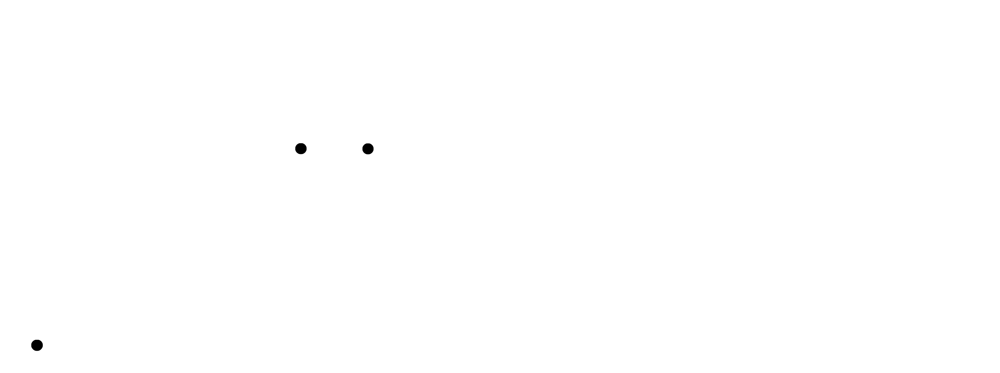


Kernel size: 53 ( 19 percent of width ) ------------------------------------------------------


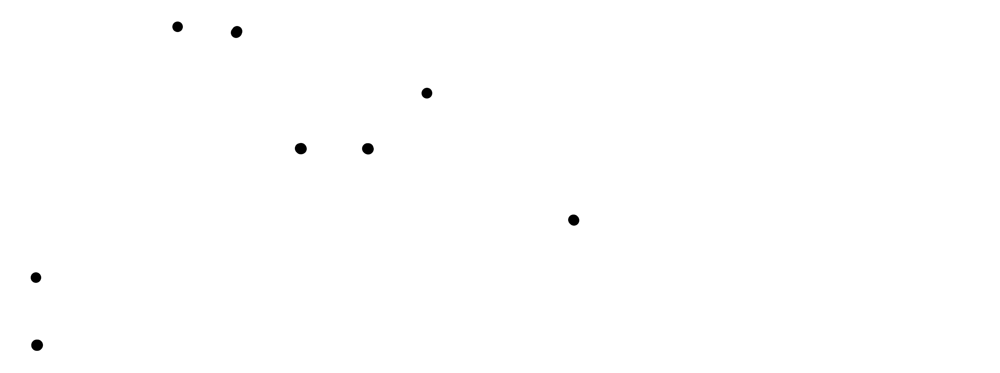


Kernel size: 50 ( 18 percent of width ) ------------------------------------------------------


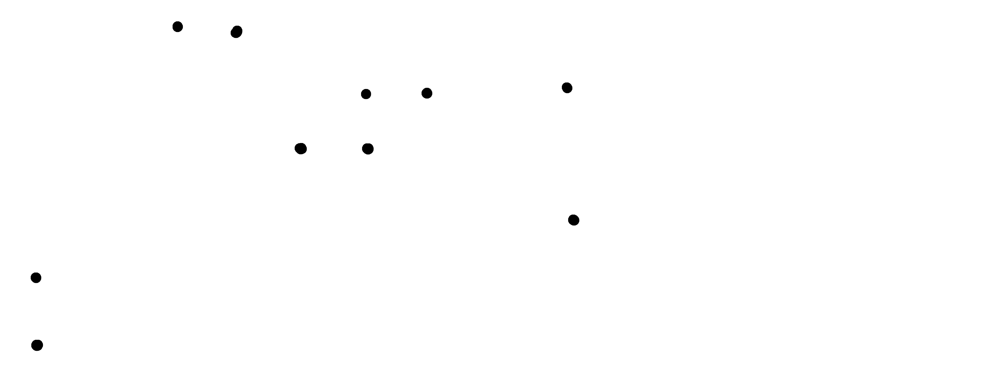


Kernel size: 47 ( 17 percent of width ) ------------------------------------------------------


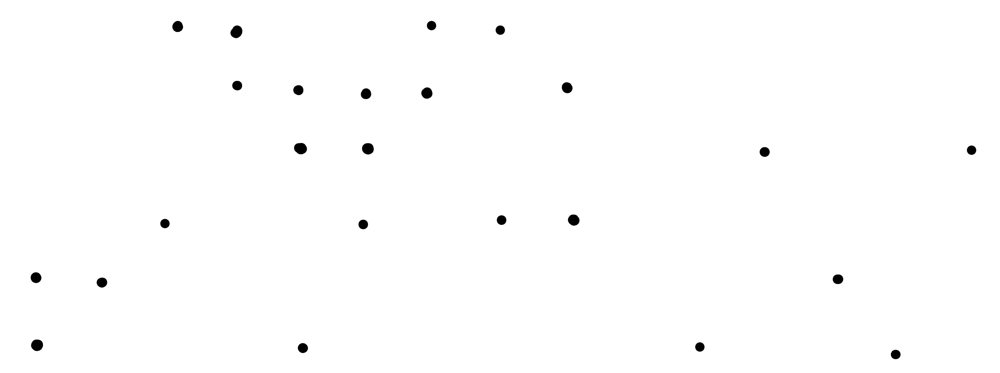


Kernel size: 44 ( 16 percent of width ) ------------------------------------------------------


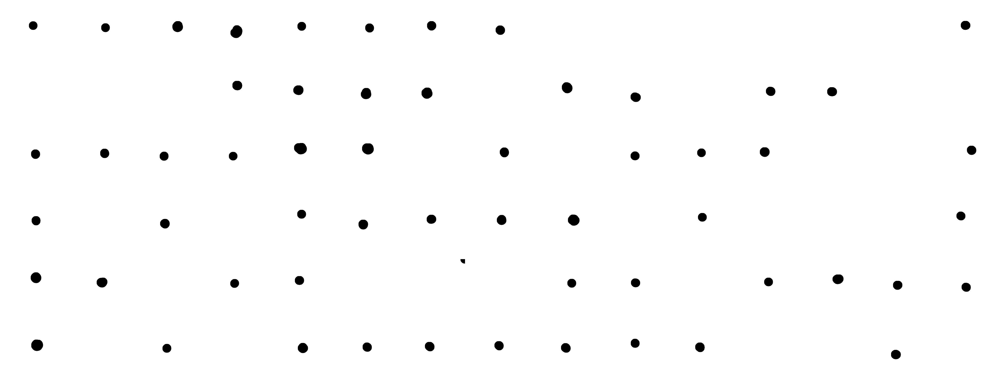


Kernel size: 42 ( 15 percent of width ) ------------------------------------------------------


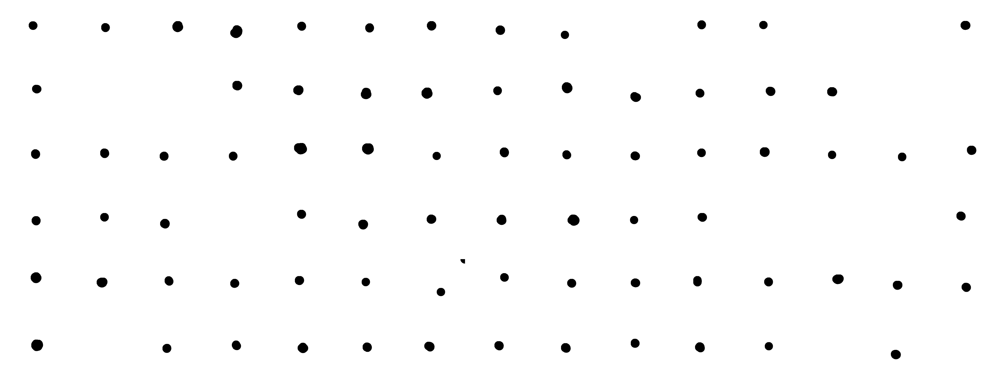


Kernel size: 39 ( 14 percent of width ) ------------------------------------------------------


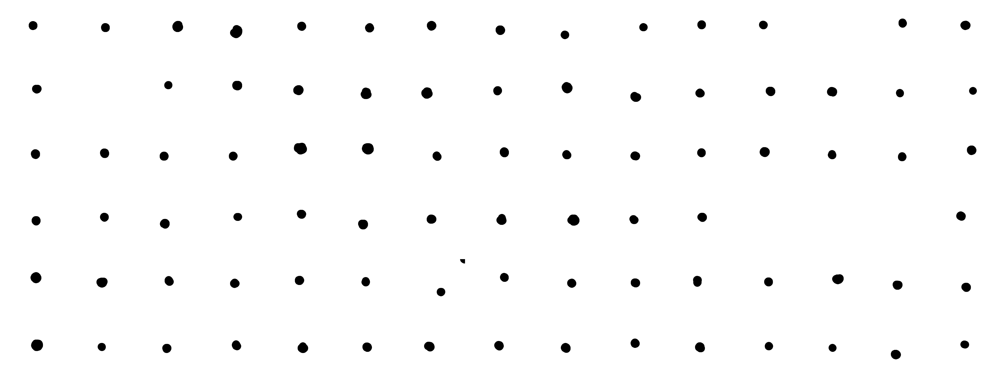


Kernel size: 36 ( 13 percent of width ) ------------------------------------------------------


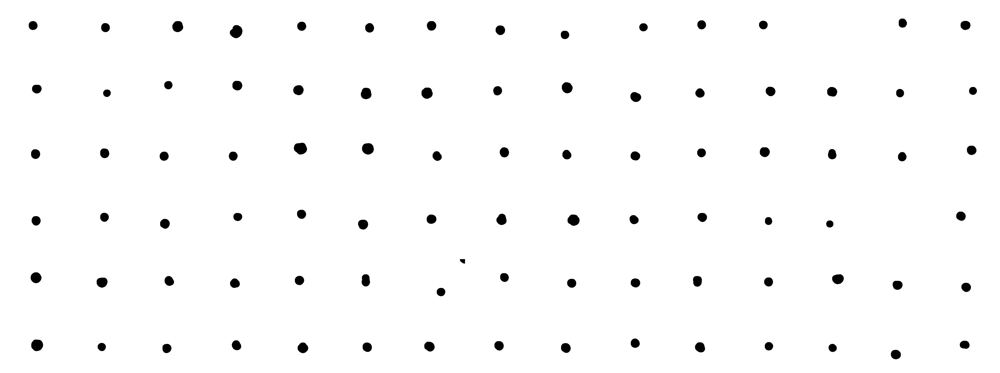


Kernel size: 33 ( 12 percent of width ) ------------------------------------------------------


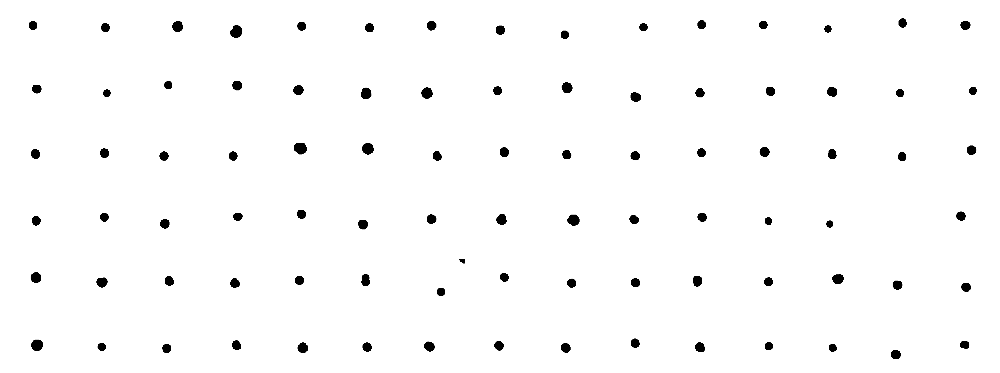


Kernel size: 30 ( 11 percent of width ) ------------------------------------------------------


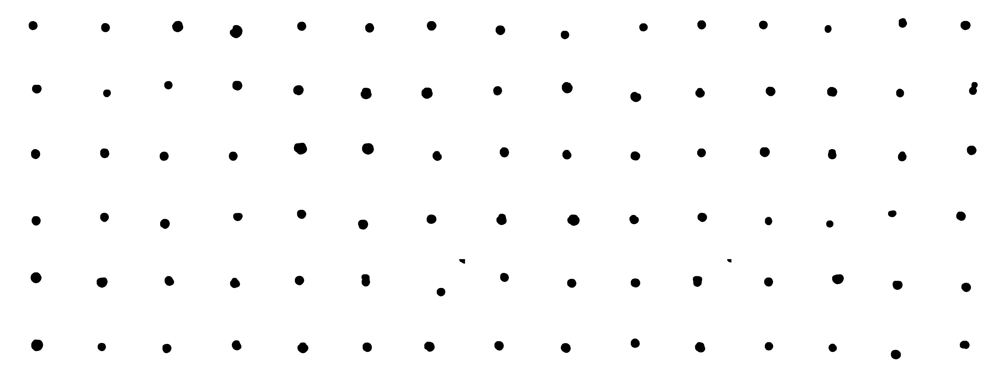


Kernel size: 28 ( 10 percent of width ) ------------------------------------------------------


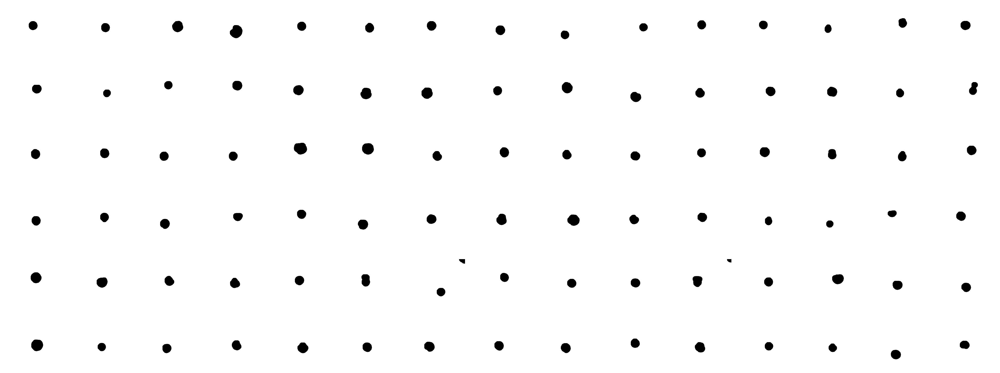


Kernel size: 25 ( 9 percent of width ) ------------------------------------------------------


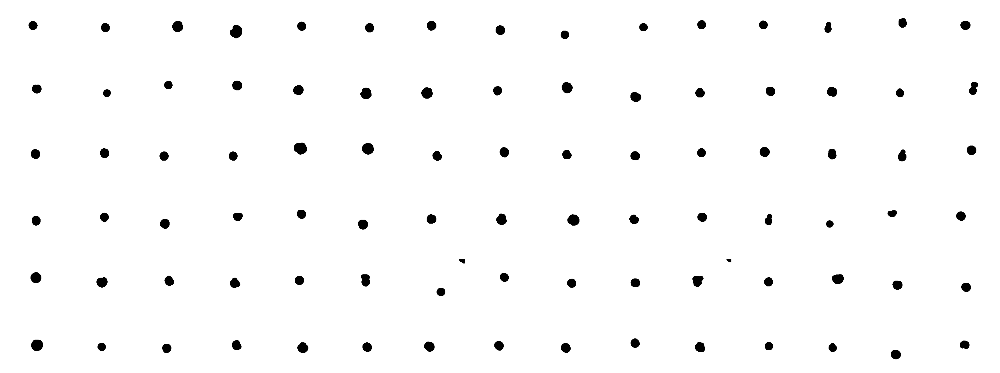


Kernel size: 22 ( 8 percent of width ) ------------------------------------------------------


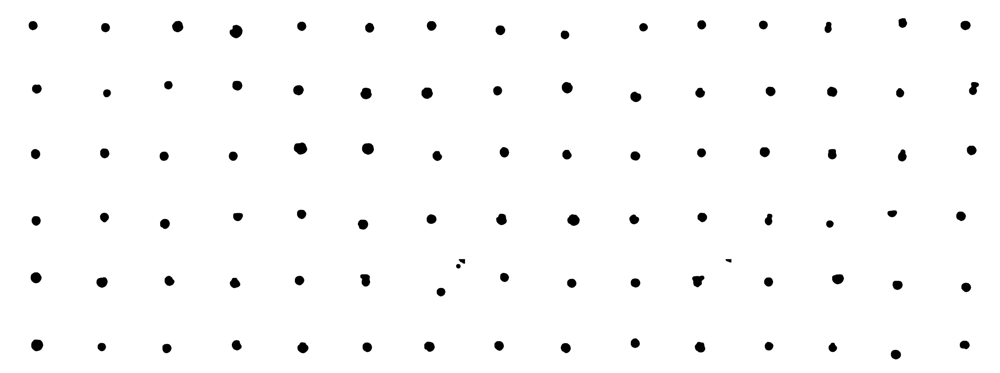


Kernel size: 19 ( 7 percent of width ) ------------------------------------------------------


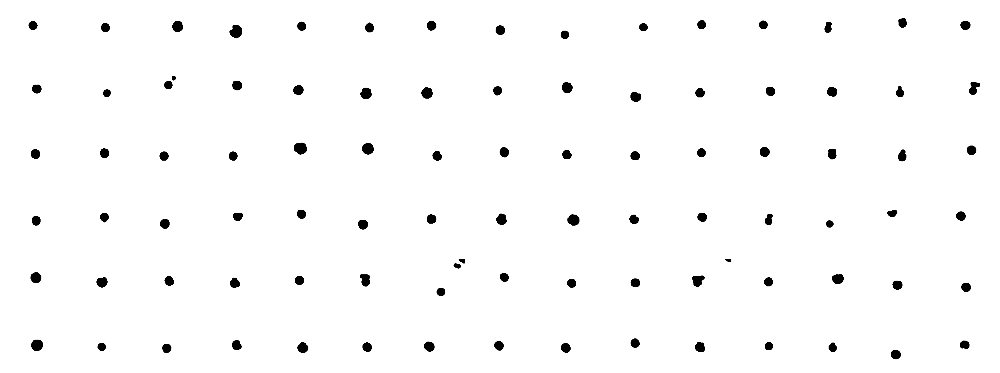


Kernel size: 16 ( 6 percent of width ) ------------------------------------------------------


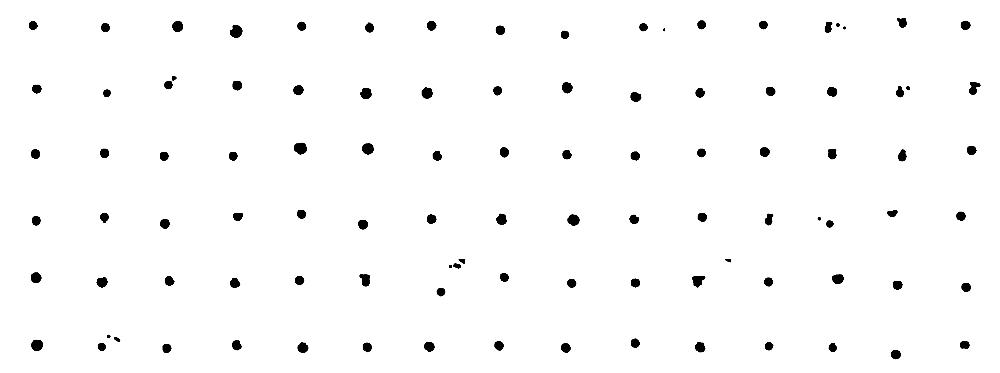


Kernel size: 14 ( 5 percent of width ) ------------------------------------------------------


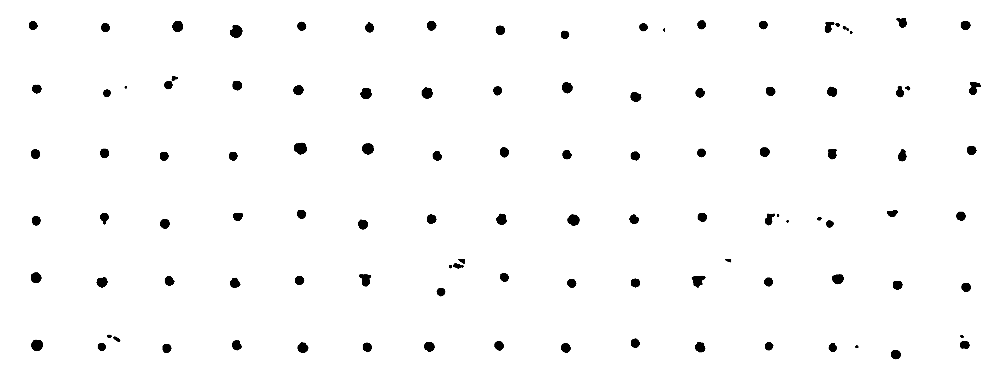

In [8]:
step = 1
min_percent_of_width = 5
max_percent_of_width = 20
for percent_of_width in [round(max_percent_of_width - i*step, 3) for i in range(int((max_percent_of_width-min_percent_of_width)/step) + 1)]:
    
    kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
    if kernel_size == 0:
        continue
    print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')

    structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
    opened_images = [opening(img, structuring_element, anchor) for img in closed_images]
    preview_images(opened_images, num_previews=len(opened_images))
    
    print()

## Result

The best result for closing operation was whenthe kernel size was of 5.5% of the image's width. As for the closing operation the best size was 10% of the image's width.

Image 0: final threshold P/X = 5.66 (factor X = 5.70), white ratio = 0.975
Image 1: final threshold P/X = 6.27 (factor X = 5.30), white ratio = 0.974
Image 2: final threshold P/X = 3.79 (factor X = 6.35), white ratio = 0.974
Image 3: final threshold P/X = 3.80 (factor X = 6.60), white ratio = 0.969
Image 4: final threshold P/X = 7.93 (factor X = 4.55), white ratio = 0.975
Image 5: final threshold P/X = 6.20 (factor X = 5.20), white ratio = 0.975
Image 6: final threshold P/X = 3.59 (factor X = 7.00), white ratio = 0.975
Image 7: final threshold P/X = 3.09 (factor X = 7.15), white ratio = 0.975
Image 8: final threshold P/X = 7.74 (factor X = 4.40), white ratio = 0.975
Image 9: final threshold P/X = 6.92 (factor X = 4.65), white ratio = 0.974
Image 10: final threshold P/X = 4.96 (factor X = 6.05), white ratio = 0.975
Image 11: final threshold P/X = 7.44 (factor X = 5.00), white ratio = 0.975
Image 12: final threshold P/X = 15.77 (factor X = 3.15), white ratio = 0.973
Image 13: final thres

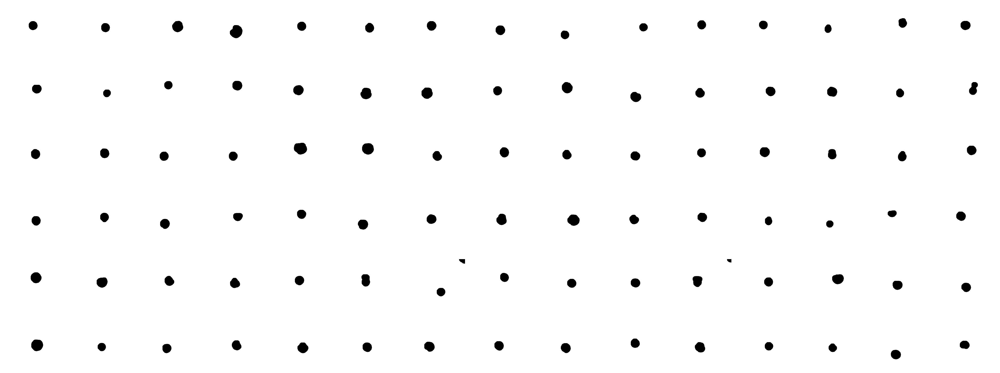

In [19]:
images = load_images_ending_with_pattern('MMU-Iris-Database', r'.*[^0-9]?1\.[a-zA-Z]+$')

grey_images = convert_images_to_greyscale(images)
binarized_pupil_images = adaptive_binarize_pupil(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=0.975,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (5.5/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (10/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
opened_images = [opening(img, structuring_element, anchor) for img in closed_images]

preview_images(opened_images, num_previews=len(opened_images))

## Testing on different data set

Image 0: final threshold P/X = 6.17 (factor X = 5.05), white ratio = 0.968
Image 1: final threshold P/X = 6.98 (factor X = 4.75), white ratio = 0.973
Image 2: final threshold P/X = 11.67 (factor X = 3.60), white ratio = 0.972
Image 3: final threshold P/X = 3.88 (factor X = 5.70), white ratio = 0.973
Image 4: final threshold P/X = 3.16 (factor X = 5.10), white ratio = 0.967
Image 5: final threshold P/X = 6.15 (factor X = 4.75), white ratio = 0.972
Image 6: final threshold P/X = 4.58 (factor X = 5.25), white ratio = 0.969
Image 7: final threshold P/X = 3.55 (factor X = 5.65), white ratio = 0.970
Image 8: final threshold P/X = 2.84 (factor X = 6.00), white ratio = 0.966
Image 9: final threshold P/X = 5.59 (factor X = 4.85), white ratio = 0.972
Image 10: final threshold P/X = 8.07 (factor X = 4.25), white ratio = 0.974
Image 11: final threshold P/X = 6.58 (factor X = 4.60), white ratio = 0.975
Image 12: final threshold P/X = 6.69 (factor X = 4.20), white ratio = 0.972
Image 13: final thres

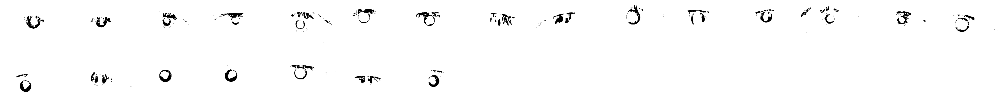

In [9]:
images = load_images_ending_with_pattern('teczowka_data', r'.*[^0-9]?1\.[a-zA-Z]+$')

images = resize_images(images, max_size=256)
grey_images = convert_images_to_greyscale(images)
binarized_pupil_images = adaptive_binarize_pupil(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=0.975,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

preview_images(binarized_pupil_images, num_previews=len(binarized_pupil_images))

### Closing parameters

Kernel size: 106 ( 50 percent of width ) ------------------------------------------------------


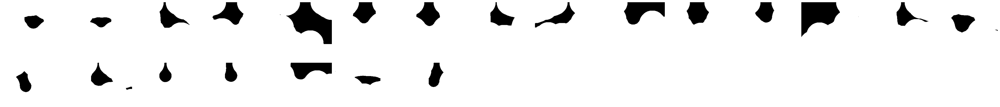


Kernel size: 85 ( 40 percent of width ) ------------------------------------------------------


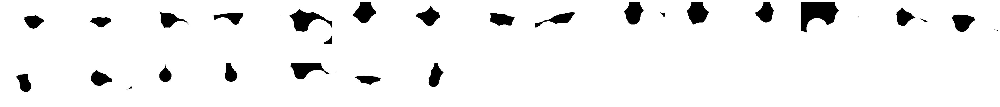


Kernel size: 63 ( 30 percent of width ) ------------------------------------------------------


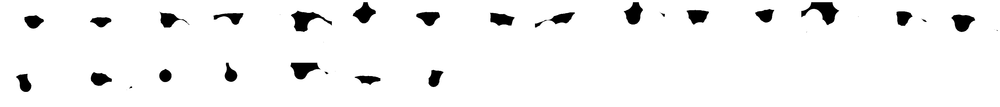


Kernel size: 42 ( 20 percent of width ) ------------------------------------------------------


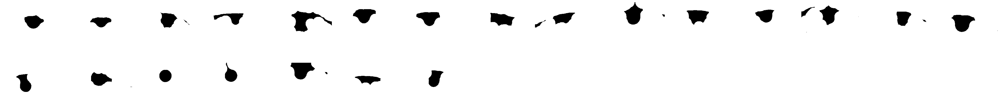

In [11]:
step = 10
min_percent_of_width = 20
max_percent_of_width = 50

for percent_of_width in [round(max_percent_of_width - i*step, 3) for i in range(int((max_percent_of_width-min_percent_of_width)/step) + 1)]:
    
    kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
    print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')
    
    structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
    closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]
    preview_images(closed_images, num_previews=len(closed_images))
    
    print()

Kernel size: 42 ( 20 percent of width ) ------------------------------------------------------


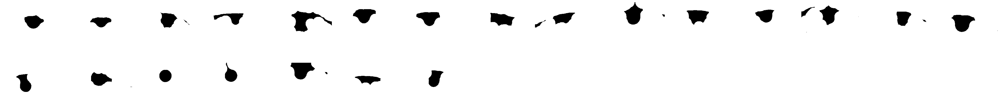


Kernel size: 40 ( 19 percent of width ) ------------------------------------------------------


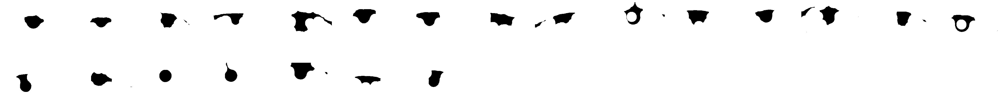


Kernel size: 38 ( 18 percent of width ) ------------------------------------------------------


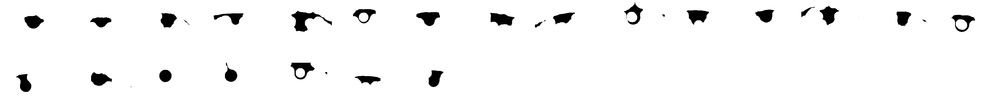


Kernel size: 36 ( 17 percent of width ) ------------------------------------------------------


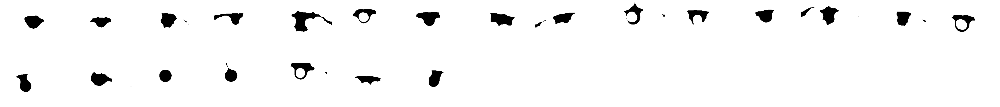


Kernel size: 34 ( 16 percent of width ) ------------------------------------------------------


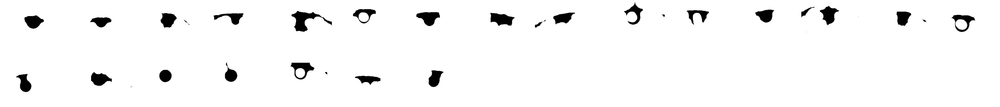


Kernel size: 31 ( 15 percent of width ) ------------------------------------------------------


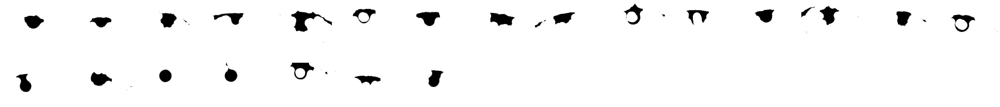


Kernel size: 29 ( 14 percent of width ) ------------------------------------------------------


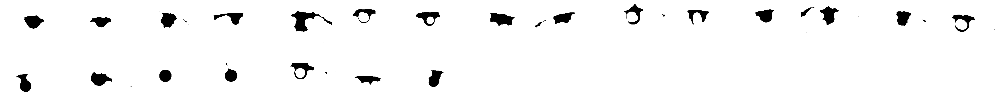


Kernel size: 27 ( 13 percent of width ) ------------------------------------------------------


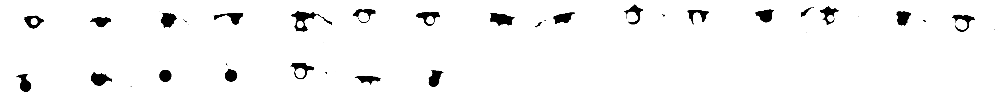


Kernel size: 25 ( 12 percent of width ) ------------------------------------------------------


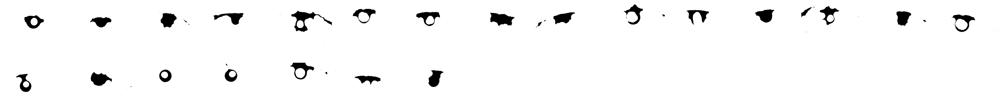


Kernel size: 23 ( 11 percent of width ) ------------------------------------------------------


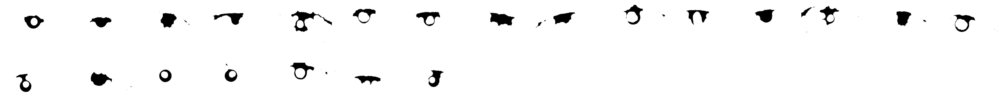

In [12]:
step = 1
min_percent_of_width = 11
max_percent_of_width = 20

for percent_of_width in [round(max_percent_of_width - i*step, 3) for i in range(int((max_percent_of_width-min_percent_of_width)/step) + 1)]:
    
    kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
    print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')
    
    structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
    closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]
    preview_images(closed_images, num_previews=len(closed_images))
    
    print()

Kernel size: 21 ( 10.0 percent of width ) ------------------------------------------------------


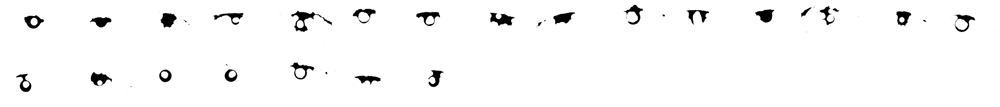


Kernel size: 20 ( 9.5 percent of width ) ------------------------------------------------------


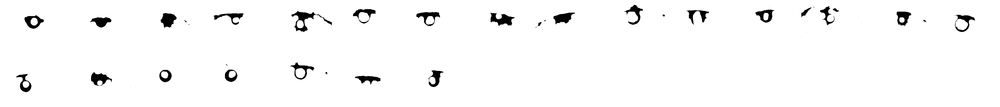


Kernel size: 19 ( 9.0 percent of width ) ------------------------------------------------------


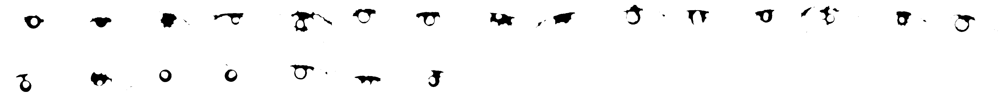


Kernel size: 18 ( 8.5 percent of width ) ------------------------------------------------------


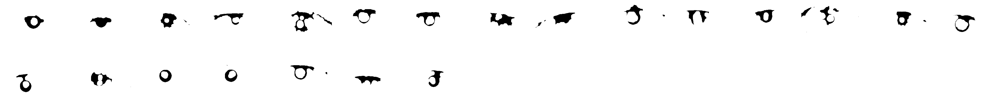


Kernel size: 17 ( 8.0 percent of width ) ------------------------------------------------------


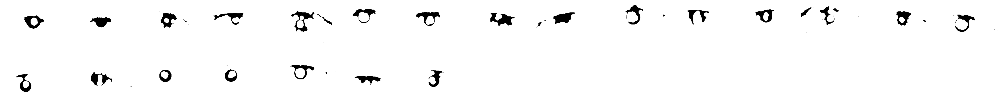


Kernel size: 15 ( 7.5 percent of width ) ------------------------------------------------------


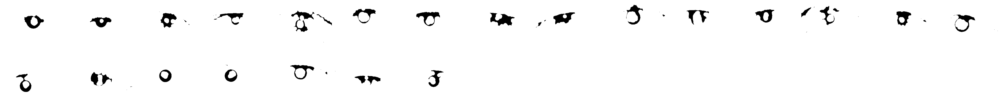


Kernel size: 14 ( 7.0 percent of width ) ------------------------------------------------------


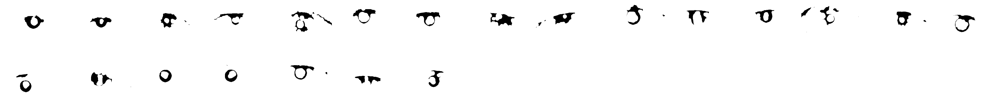


Kernel size: 13 ( 6.5 percent of width ) ------------------------------------------------------


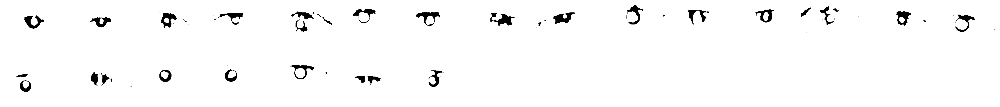


Kernel size: 12 ( 6.0 percent of width ) ------------------------------------------------------


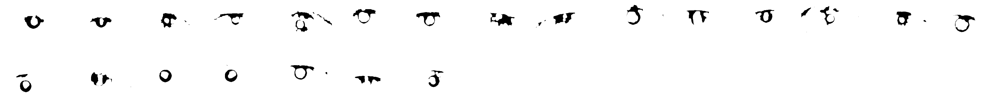


Kernel size: 11 ( 5.5 percent of width ) ------------------------------------------------------


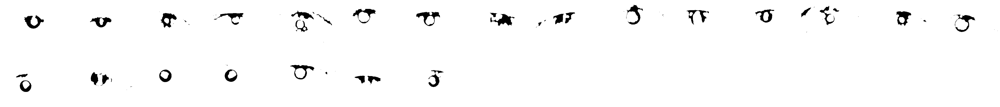


Kernel size: 10 ( 5.0 percent of width ) ------------------------------------------------------


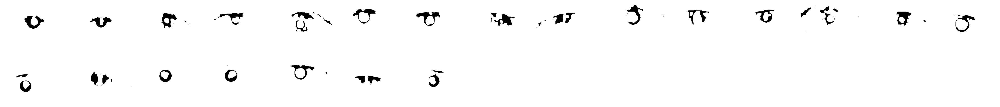


Kernel size: 9 ( 4.5 percent of width ) ------------------------------------------------------


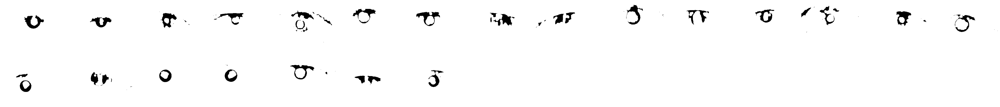


Kernel size: 8 ( 4.0 percent of width ) ------------------------------------------------------


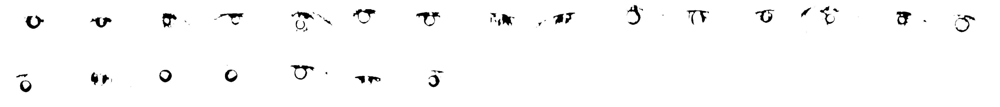


Kernel size: 7 ( 3.5 percent of width ) ------------------------------------------------------


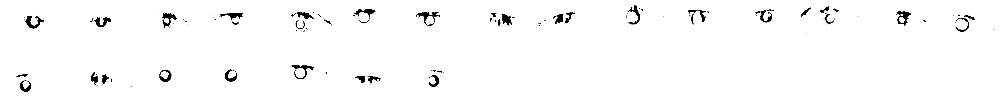


Kernel size: 6 ( 3.0 percent of width ) ------------------------------------------------------


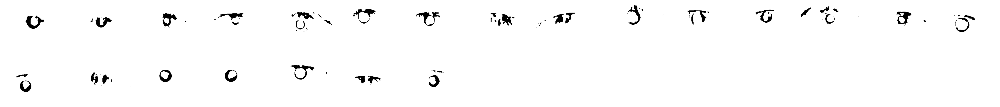


Kernel size: 5 ( 2.5 percent of width ) ------------------------------------------------------


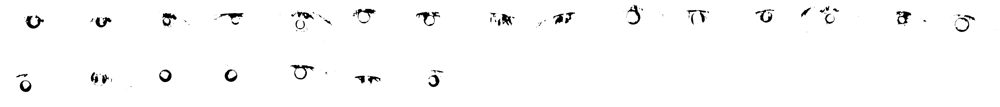


Kernel size: 4 ( 2.0 percent of width ) ------------------------------------------------------


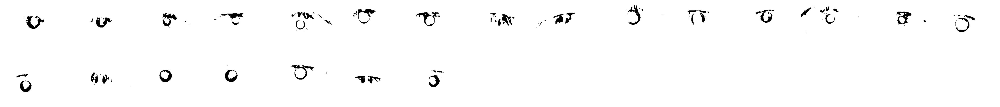


Kernel size: 3 ( 1.5 percent of width ) ------------------------------------------------------


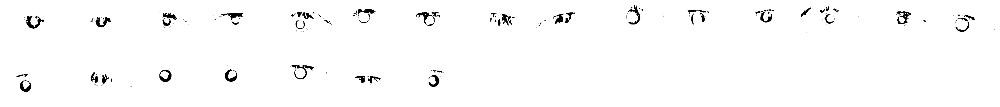


Kernel size: 2 ( 1.0 percent of width ) ------------------------------------------------------


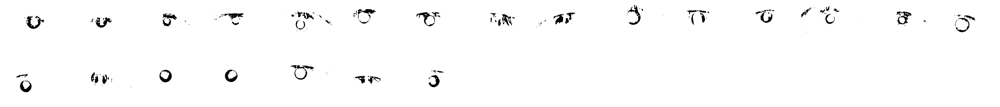


Kernel size: 1 ( 0.5 percent of width ) ------------------------------------------------------


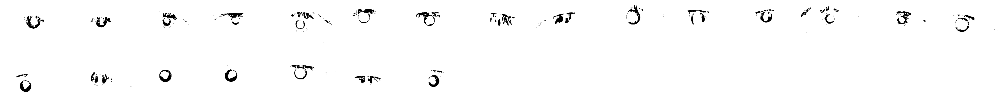

In [10]:
step = 0.5
min_percent_of_width = 0.5
max_percent_of_width = 10

for percent_of_width in [round(max_percent_of_width - i*step, 3) for i in range(int((max_percent_of_width-min_percent_of_width)/step) + 1)]:
    
    kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
    print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')
    
    structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
    closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]
    preview_images(closed_images, num_previews=len(closed_images))
    
    print()

### Best closing parameters

Kernel size: 42 ( 20 percent of width ) ------------------------------------------------------


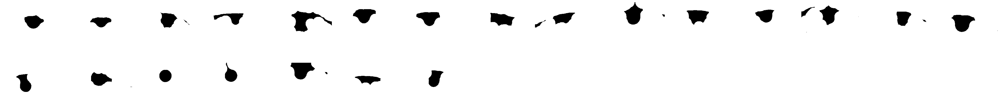

In [13]:
percent_of_width = 20

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')

structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]

preview_images(closed_images, num_previews=len(closed_images))

### Opening parameters

Kernel size: 85 ( 40 percent of width ) ------------------------------------------------------


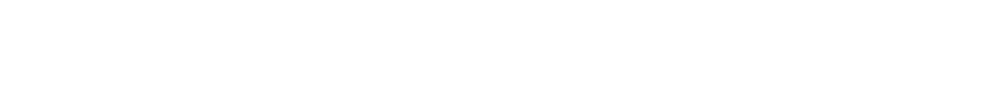


Kernel size: 74 ( 35 percent of width ) ------------------------------------------------------


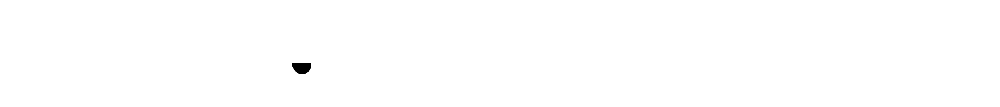


Kernel size: 63 ( 30 percent of width ) ------------------------------------------------------


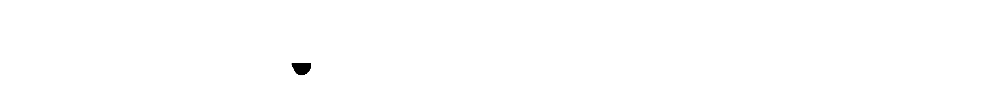


Kernel size: 53 ( 25 percent of width ) ------------------------------------------------------


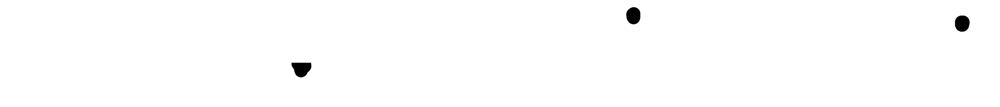


Kernel size: 42 ( 20 percent of width ) ------------------------------------------------------


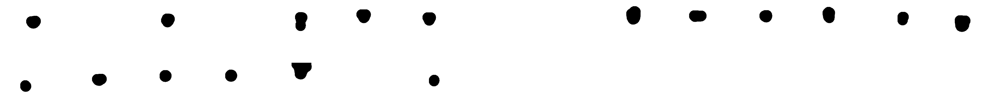


Kernel size: 31 ( 15 percent of width ) ------------------------------------------------------


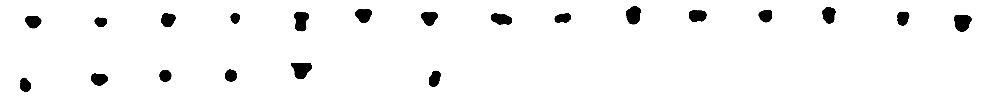


Kernel size: 21 ( 10 percent of width ) ------------------------------------------------------


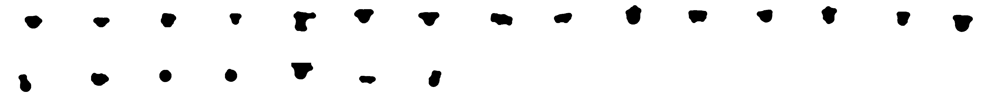


Kernel size: 10 ( 5 percent of width ) ------------------------------------------------------


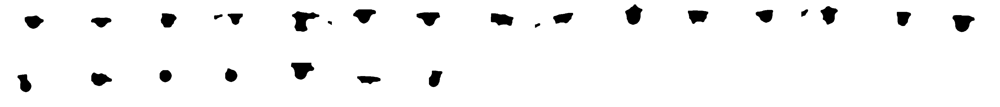

In [14]:
step = 5
min_percent_of_width = 5
max_percent_of_width = 40
for percent_of_width in [round(max_percent_of_width - i*step, 3) for i in range(int((max_percent_of_width-min_percent_of_width)/step) + 1)]:
    
    kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (percent_of_width/100))
    if kernel_size == 0:
        continue
    print('Kernel size:', kernel_size, '(', percent_of_width, 'percent of width )', '------------------------------------------------------')

    structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
    opened_images = [opening(img, structuring_element, anchor) for img in closed_images]
    preview_images(opened_images, num_previews=len(opened_images))
    
    print()

### Result

For this data set the best kernel sizes were different than those in the previous data set. For closing the smallest kernel size that patched all pupils was 20% of image's width and the opening parameter was the same as last time - 10% of image's width. The reason is that here the pupil had more reflections so only the outlier of the pupil was the darkest and was mapped to black during binarization. In order to fill the holes in pupils I needed to use much larger structual element which also enchanced other artifacts to a greater degree. If I wanted to use the same parameters for both data sets I need to use the larger kernels from this data because otherwise I wouldn't be able to detect pupils here. Of course using a larger kernel worsens the results on the previous data set, but at least both data sets yield usable results.

Image 0: final threshold P/X = 6.17 (factor X = 5.05), white ratio = 0.968
Image 1: final threshold P/X = 6.98 (factor X = 4.75), white ratio = 0.973
Image 2: final threshold P/X = 11.67 (factor X = 3.60), white ratio = 0.972
Image 3: final threshold P/X = 3.88 (factor X = 5.70), white ratio = 0.973
Image 4: final threshold P/X = 3.16 (factor X = 5.10), white ratio = 0.967
Image 5: final threshold P/X = 6.15 (factor X = 4.75), white ratio = 0.972
Image 6: final threshold P/X = 4.58 (factor X = 5.25), white ratio = 0.969
Image 7: final threshold P/X = 3.55 (factor X = 5.65), white ratio = 0.970
Image 8: final threshold P/X = 2.84 (factor X = 6.00), white ratio = 0.966
Image 9: final threshold P/X = 5.59 (factor X = 4.85), white ratio = 0.972
Image 10: final threshold P/X = 8.07 (factor X = 4.25), white ratio = 0.974
Image 11: final threshold P/X = 6.58 (factor X = 4.60), white ratio = 0.975
Image 12: final threshold P/X = 6.69 (factor X = 4.20), white ratio = 0.972
Image 13: final thres

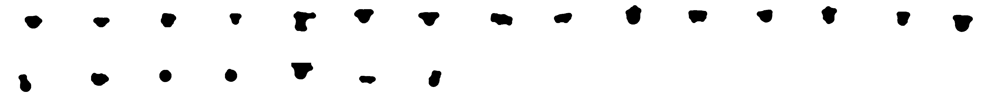

In [20]:
images = load_images_ending_with_pattern('teczowka_data', r'.*[^0-9]?1\.[a-zA-Z]+$')

images = resize_images(images, max_size=256)
grey_images = convert_images_to_greyscale(images)
binarized_pupil_images = adaptive_binarize_pupil(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=0.975,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (20/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (10/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
opened_images = [opening(img, structuring_element, anchor) for img in closed_images]

preview_images(opened_images, num_previews=len(opened_images))

### Results on MMU-Iris-Database data set with parameters choosen here

Image 0: final threshold P/X = 5.66 (factor X = 5.70), white ratio = 0.975
Image 1: final threshold P/X = 6.27 (factor X = 5.30), white ratio = 0.974
Image 2: final threshold P/X = 3.79 (factor X = 6.35), white ratio = 0.974
Image 3: final threshold P/X = 3.80 (factor X = 6.60), white ratio = 0.969
Image 4: final threshold P/X = 7.93 (factor X = 4.55), white ratio = 0.975
Image 5: final threshold P/X = 6.20 (factor X = 5.20), white ratio = 0.975
Image 6: final threshold P/X = 3.59 (factor X = 7.00), white ratio = 0.975
Image 7: final threshold P/X = 3.09 (factor X = 7.15), white ratio = 0.975
Image 8: final threshold P/X = 7.74 (factor X = 4.40), white ratio = 0.975
Image 9: final threshold P/X = 6.92 (factor X = 4.65), white ratio = 0.974
Image 10: final threshold P/X = 4.96 (factor X = 6.05), white ratio = 0.975
Image 11: final threshold P/X = 7.44 (factor X = 5.00), white ratio = 0.975
Image 12: final threshold P/X = 15.77 (factor X = 3.15), white ratio = 0.973
Image 13: final thres

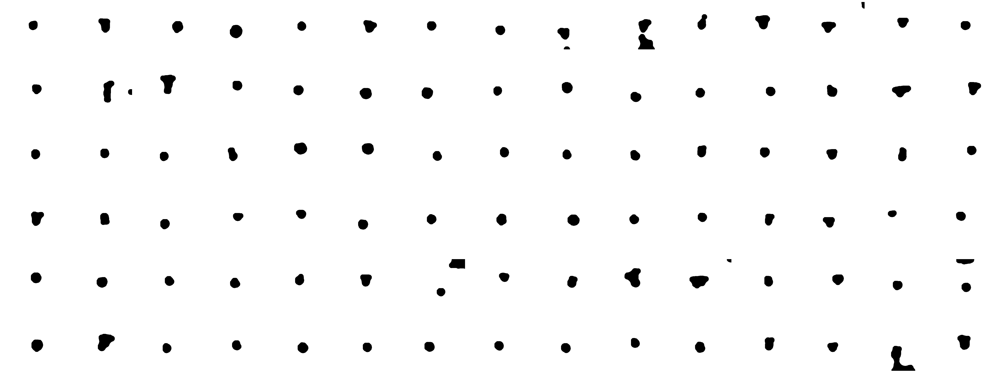

In [18]:
images = load_images_ending_with_pattern('MMU-Iris-Database', r'.*[^0-9]?1\.[a-zA-Z]+$')

grey_images = convert_images_to_greyscale(images)
binarized_pupil_images = adaptive_binarize_pupil(
        grey_images,
        initial_factor=15,
        white_ratio_thresh=0.975,
        min_factor=1.0,
        factor_step=0.05,
        verbose=False
)

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (20/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
closed_images = [closing(img, structuring_element, anchor) for img in binarized_pupil_images]

kernel_size = math.floor(np.mean(binarized_pupil_images[0].shape) * (10/100))
structuring_element, anchor = get_structuring_element(shape="ellipse", ksize=(kernel_size, kernel_size), anchor=None)
opened_images = [opening(img, structuring_element, anchor) for img in closed_images]

preview_images(opened_images, num_previews=len(opened_images))

## Conclusion

Here the optimal structuring element shape for the MMU-Iris-Database data set was circle and the size for closing operation was 5.5% and for opening was 10% of the image's width.

For the other data set the parameters were the same but the kernel size for the closing operation was increased to 20%. Smaller kernel sizes don't work. The kernel size of 20% works for this data set, but on the MMU-Iris-Database the results are worse than with the previously specified parameters.

Another thing that can help improve the results is to map pixel outside of a certain range of the center of the image to white. Artifacts close to border sometimes persist and we can safely assume it isn't the pupil sense the pupil is always around the center of the image.